# UC San Diego: Neural Data Science
## Alzheimers Study: scRNA Sequencing Analysis of Hallmark Genes Associated with Amyloid Beta vs. Tau Tangles

## Permissions

Place an `X` in the appropriate bracket below to specify if you would like your group's project to be made available to the public. (Note that student names will be included (but PIDs will be scraped from any groups who include their PIDs).

* [ X ] YES - make available
* [  ] NO - keep private

# Names

- Kristoffer Alejo
- Nhathan Nguyen
- Teresa Tian
- Brandon Huynh


# Overview

Using data collected in a experiment conducted by Xenium 10x Genomics, we conducted an exploratory analysis on Alzheimers disease mouse over a time course series of 2.5, 5.7, 13.2, and 19.9 months. In our exploratory analysis, we generated a umap with leiden clusters in which we would label using the following resources: [Azimuth HuBMAP](https://azimuth.hubmapconsortium.org/references/mouse_motorcortex/) and [Allen Brain Atlas](https://atlas.brain-map.org/atlas?atlas=1&plate=100960301#atlas=1&plate=100960248&resolution=11.97&x=7202.874581473215&y=3786.7497907366073&zoom=-3&z=5). From there we looked at a 2 gene panels, one associated with Amyloid Beta production and the other assoicated with Tau Tangle production, where we mapped both the spatial location and umap location of where these genes are the most expressed. From this, we will be able to extract information in regards to which areas of the brain are most associated with Alzheimer's disease, and which cell types are highly involved in these processes.

<a id='research_question'></a>
# Research Question

Using scRNA sequencing, can we find any patterns in the distribution of hallmark gene markers associated with Amyloid Beta and Tau Tangles across both different cell types, as well as their spatial location? 

<a id='background'></a>

## Background & Prior Work

Our group's proposal will go in depth into a fundamental search in Alzheimer's disease (AD) research: understanding how the expression levels of genes associated with amyloid beta and tau tangles vary across different cell types in the brain's gray and white matter. This question is motivated by the urgent need to deepen our comprehension of the cellular dynamics underlying AD pathology, as this neurodegenerative disorder continues to pose significant challenges in diagnosis and treatment. The accumulation of amyloid beta plaques and tau tangles in the brain is a hallmark feature of AD, but the precise cellular environments and mechanisms driving their formation and progression remain elusive. By investigating the spatial distribution of key genes involved in AD pathology across various brain cell types, our study aims to shed light on the intricate interplay between genetic factors and cellular contexts in disease development.

A key aspect of our motivation stems from the insights provided by published research addressing similar aspects of AD pathogenesis. One study, "Genetic variability in response to amyloid beta deposition influences Alzheimer’s disease risk", explores the transcriptional network associated with amyloid deposition in AD, highlighting the significance of gene expression patterns in disease progression. Additionally, the "Museum of spatial transcriptomics" paper offers valuable insights into the methodologies for quantifying mRNA expression spatially within tissues, particularly in neurodegenerative diseases like AD. These studies not only underscore the complexity of AD pathology but also emphasize the potential of spatial transcriptomics approaches to unraveling the cellular dynamics underlying disease progression.

Building upon the foundation laid by these seminal works, our proposal will try to integrate advanced techniques and publicly available datasets to advance our understanding of AD pathogenesis. By leveraging spatial transcriptomics data from an AD mouse model, we want to attempt to map the expression patterns of key AD-related genes across different brain cell types. Through meticulous data analysis, including dimensionality reduction and clustering, we seek to understand how gene expression profiles vary within and between gray and white matter regions. Ultimately, our study holds the promise of uncovering novel insights into the cellular mechanisms driving AD pathology, with implications for the development of targeted therapeutic interventions aimed at mitigating the devastating effects of this debilitating neurodegenerative disorde

References:

- 1) Moses, L., & Pachter, L. (2022). Museum of spatial transcriptomics. Nature Methods, 19(5), 534–546. https://doi.org/10.1038/s41592-022-01409-2
- 2) Salih, D. A., Bayram, S., Guelfi, S., Reynolds, R. H., Shoai, M., Ryten, M., Brenton, J. W., Zhang, D., Matarin, M., Botia, J. A., Shah, R., Brookes, K. J., Guetta-Baranes, T., Morgan, K., Bellou, E., Cummings, D. M., Escott-Price, V., & Hardy, J. (2019). Genetic variability in response to amyloid beta deposition influences alzheimer’s disease risk. Brain communications. https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7145452/

- 3) Sehar, U., Rawat, P., Reddy, A. P., Kopel, J., & Reddy, P. H. (2022). Amyloid beta in aging and Alzheimer’s disease. International Journal of Molecular Sciences, 23(21), 12924. https://doi.org/10.3390/ijms232112924

# Hypothesis


We predict that our pipeline will be able to look at the genes associated with Alzheimer's disease particularly the genes associated with the production of amyloid beta and tau tangles,  and be able to show which particular cell types are most responsible for those processes, and thereby which cell types are most greatly affected by Alzheimer’s disease


# Dataset(s)

### Feature-barcode matrix of Immunofluorescence Alzheimer's Disease Mouse Model Brain Over a Time Course
- Link to the dataset: https://cf.10xgenomics.com/samples/spatial-exp/1.3.1/VisiumFFPE_Mouse_Brain_Alzheimers_AppNote/VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_raw_feature_bc_matrix.h5
- Number of observations: 59,897 cells x 32,589 genes

A gene expression matrix of consisting of the number of transcripts of each gene in a panel size of 32,589 for each cell that was sampled. This dataset contains both a control mouse in addition to an Alzheimer's disease mouse (App-overexpressing mouse) measured over a time series of 2.5, 5.7, 13.2, and 19.9 months

### Tissue Positions List CSV of Immunofluorescence Alzheimer's Disease Mouse Model Brain Over a Time Course
- Link to the dataset: https://cf.10xgenomics.com/samples/spatial-exp/1.3.1/VisiumFFPE_Mouse_Brain_Alzheimers_AppNote/VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggr_tissue_positions_list.csv
- Number of observations: 59,904 cells

A dataframe consisitng of 59904 cells measuring 6 different variables, of which mainly include cell_id, X_spatial, and Y_spatial. These spatial coordinates allow us to map the location of each cell in a 2D space, allowing a depiction of a mouse brain image

To combine these datasets, we plan on using the python library scanpy which will allow us to store both datasets in a multistructured object, where the eature-barcode matrix will be stored as a numpy array and the tissue position can be stored in an observations dataframe.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import anndata
import umap.umap_ as umap
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
from scipy.stats import zscore
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
import time
import tarfile
from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from scipy import sparse
from Class.analysis_tools import Tools

%matplotlib inline

> Note: we have created a class called Tools, which will be implemented in generating the data visualizations.
> In addition, this analysis is a multistep process of first identifying cell types from gene expression, then analyzing gene expression levels using known Alzheimers's disease genes

# Data Wrangling

To pull the data into python, we will have to load the feature barcode matrix in addition to the tissue positions csv file. In addition we will generate 2 additional variables of interest of which include total number of transcripts per cell in addition to number of genes expressed per cell. In regards to the tissue positions csv file, additional data cleaning will be needed to separate each mouse brain sample from each other.

In [3]:
# Load feature barcode matrix as a scanpy object matrix
alz_scdata = sc.read_10x_h5(r"VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_raw_feature_bc_matrix.h5")
alz_scdata

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 59897 × 32589
    var: 'gene_ids', 'feature_types', 'genome'

>Now we will load the tissue positions csv file and conduct additional data cleaning. This includes readjusting spatial coordinates for cells in addition to filtering out for only cells that are included in alz_scdata

In [5]:
spatial_coordinates = pd.read_csv(r"C:\Users\krist\Cogs_138_Project\VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggr_tissue_positions_list.csv")
spatial_coordinates

,Cell_id,Unnamed: 1,Unnamed: 2,Unnamed: 3,X spatial,Y spatial
0,ACGCCTGACACGCGCT-1,0,0,0,1892,11212
1,TACCGATCCAACACTT-1,0,1,1,2012,11144
2,ATTAAAGCGGACGAGC-1,0,0,2,1893,11075
3,GATAAGGGACGATTAG-1,0,1,3,2012,11007
4,GTGCAAATCACCAATA-1,0,0,4,1893,10938
...,...,...,...,...,...,...
59899,GAACGTTTGTATCCAC-12,0,77,123,11021,3669
59900,ATTGAATTCCCTGTAG-12,0,76,124,10903,3599
59901,TACCTCACCAATTGTA-12,0,77,125,11023,3532
59902,AGTCGAATTAGCGTAA-12,0,76,126,10905,3461


# Data Cleaning

>We will now generate a sample_id for each cell, in order to identify which mouse each cell belongs to

In [6]:
sample_id_list = []
for i in range(1,13):
    list = [i for _ in range(int(spatial_coordinates.shape[0]/12))]
    sample_id_list += list
spatial_coordinates['Sample ID'] = sample_id_list
spatial_coordinates

,Cell_id,Unnamed: 1,Unnamed: 2,Unnamed: 3,X spatial,Y spatial,Sample ID
0,ACGCCTGACACGCGCT-1,0,0,0,1892,11212,1
1,TACCGATCCAACACTT-1,0,1,1,2012,11144,1
2,ATTAAAGCGGACGAGC-1,0,0,2,1893,11075,1
3,GATAAGGGACGATTAG-1,0,1,3,2012,11007,1
4,GTGCAAATCACCAATA-1,0,0,4,1893,10938,1
...,...,...,...,...,...,...,...
59899,GAACGTTTGTATCCAC-12,0,77,123,11021,3669,12
59900,ATTGAATTCCCTGTAG-12,0,76,124,10903,3599,12
59901,TACCTCACCAATTGTA-12,0,77,125,11023,3532,12
59902,AGTCGAATTAGCGTAA-12,0,76,126,10905,3461,12


> Now we will adjust the spatial coordinates for each sample so that each sample will be assigned their own grid. NOTE: Because alz_scdata also includes background cells, the Tissue positions will also contain the coordinates for the background.

C:\Users\krist\AppData\Local\Temp\ipykernel_43728\2018566191.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['X spatial'] = subset['X spatial'] + j * 10000
C:\Users\krist\AppData\Local\Temp\ipykernel_43728\2018566191.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['X spatial'] = subset['X spatial'] + j * 10000
C:\Users\krist\AppData\Local\Temp\ipykernel_43728\2018566191.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

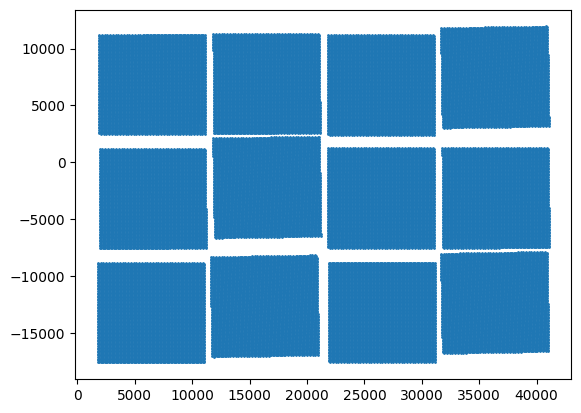

In [7]:
subset_background_df = pd.DataFrame()
for i,j in zip(range(1,5), range(0,4)):
    subset = spatial_coordinates[spatial_coordinates['Sample ID'] == i]
    subset['X spatial'] = subset['X spatial'] + j * 10000
    subset_background_df = pd.concat([subset_background_df, subset])
for i,j in zip(range(5,9), range(0,4)):
    subset = spatial_coordinates[spatial_coordinates['Sample ID'] == i]
    subset['X spatial'] = subset['X spatial'] + j * 10000
    subset['Y spatial'] = subset['Y spatial'] - 10000
    subset_background_df = pd.concat([subset_background_df, subset])
for i,j in zip(range(9,13), range(0,4)):
    subset = spatial_coordinates[spatial_coordinates['Sample ID'] == i]
    subset['X spatial'] = subset['X spatial'] + j * 10000
    subset['Y spatial'] = subset['Y spatial'] - 20000
    subset_background_df = pd.concat([subset_background_df, subset])
plt.scatter(subset_background_df['X spatial'], subset_background_df['Y spatial'], s = 1)
plt.show()

> Now we will generate variables for our observations dataframe. These variables include ```transcript count``` which will quantify the number of mRNA transcripts per cell, ```n_genes``` which will quantify the number of genes expressed in each cell, ```Sample ID``` which will store which mouse each cell belongs to, and ```Background``` which identifies whether that cell is a background cell or not

In [7]:
# create new observations that sums up the total transcript count in each cell
cell_transcript_count = list(alz_scdata.X.toarray().sum(axis=1))
alz_scdata.obs['transcript_count'] = cell_transcript_count

# create new observation that sums up the total gene count in each cell
n_genes = list(np.count_nonzero(alz_scdata.X.toarray(), axis = 1))
alz_scdata.obs['n_genes'] = n_genes

spatial_coordinates_revised = alz_scdata.obs.merge(spatial_coordinates, left_index = True, right_on = 'Cell_id')

# Generate sample_id
alz_scdata.obs['Sample ID'] = list(spatial_coordinates_revised['Sample ID'])

# Generate background variable
alz_scdata.obs['Background'] = list(spatial_coordinates_revised['Unnamed: 1'])
alz_scdata.obs

,transcript_count,n_genes,Sample ID,Background
AAACAACGAATAGTTC-1,1230.0,1045,1,0
AAACAAGTATCTCCCA-1,14548.0,5831,1,1
AAACAATCTACTAGCA-1,1171.0,1003,1,0
AAACACCAATAACTGC-1,2805.0,2004,1,0
AAACAGAGCGACTCCT-1,16494.0,5913,1,1
...,...,...,...,...
TTGTTTCACATCCAGG-12,16418.0,6100,12,1
TTGTTTCATTAGTCTA-12,16662.0,6054,12,1
TTGTTTCCATACAACT-12,22381.0,7018,12,1
TTGTTTGTATTACACG-12,1098.0,937,12,0


> Now we will generate 2 observation matricies, one called ```X_spatial``` which will store the spatial coordinates for each cell in a 2D space, and ```X_raw``` which will store the raw number of transcripts of each genes for each cell

In [8]:
# generate spatial coordinates
spatial_list_df = spatial_coordinates_revised[['X spatial', 'Y spatial']]
spatial_list_matrix = spatial_list_df.values
alz_scdata.obsm['X_spatial'] = spatial_list_matrix

# generate raw transcript values
alz_scdata.obsm['X_raw'] = alz_scdata.X.toarray()
alz_scdata.obsm

AxisArrays with keys: X_spatial, X_raw

> Now we will filter out the genes variable, and only keep the columns of genes of interest. We will remove genes that contain the string 'DEPRECATED', '.' and 'Rik'. These remaining genes will be used for cell type clustering in addition to analysis of different genes

In [9]:
alz_gene_list = list(alz_scdata.var.index)
genes_to_remove = [gene for gene in alz_gene_list if 'DEPRECATED' in gene]
genes_to_keep = ~alz_scdata.var_names.isin(genes_to_remove)
alz_scdata = alz_scdata[:, genes_to_keep]
genes_to_remove2 = [var for var in alz_scdata.var.index if '.' in var]
genes_to_keep2 = ~alz_scdata.var_names.isin(genes_to_remove2)
alz_scdata = alz_scdata[:, genes_to_keep2]
genes_to_remove3 = [var for var in alz_scdata.var.index if 'Rik' in var]
genes_to_keep3 = ~alz_scdata.var_names.isin(genes_to_remove3)
alz_scdata = alz_scdata[:, genes_to_keep3]
alz_scdata

View of AnnData object with n_obs × n_vars = 59897 × 29631
    obs: 'transcript_count', 'n_genes', 'Sample ID', 'Background'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'X_spatial', 'X_raw'

> Lastly we define that a cell must contain at least 5 transcripts and must express at least 5 genes. We will filter accordingly

In [10]:
# filter out based on 'total_counts', we will set threshold as at least 5 transcripts
alz_filter_scdata = alz_scdata[alz_scdata.obs['transcript_count'] >= 5]

# filter out based on 'n_genes', we will set threshold as at least 5 genes
alz_filter_scdata = alz_filter_scdata[alz_filter_scdata.obs['n_genes'] >= 5]
alz_filter_scdata

View of AnnData object with n_obs × n_vars = 59798 × 29631
    obs: 'transcript_count', 'n_genes', 'Sample ID', 'Background'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'X_spatial', 'X_raw'

# Data Visualization

> Now we would like to generate our umap. But first, we will normalize our data, and since we have a very large number of dimensions, we would like to run a dimension reduction using PCA. From there we will generate a umap with 2 components, and run a leiden clustering algorighm in order to generate cell types. After generating the umap with leiden clusters, we would like to project those clusters back to the brain projection map

In [ ]:
sc.pp.log1p(alz_filter_scdata)
sc.pp.normalize_total(alz_filter_scdata)
sc.pp.scale(alz_filter_scdata)

In [ ]:
dimred = PCA(n_components = 100)
alz_filter_scdata.obsm['X_pca'] = dimred.fit_transform(alz_filter_scdata.X)

In [ ]:
umap_operator = umap.UMAP(n_components = 2, random_state = 42, metric = 'euclidean', min_dist = 0.01)
umap_result = umap_operator.fit_transform(alz_filter_scdata.obsm['X_pca'])
alz_filter_scdata.obsm['X_umap'] = umap_result

In [ ]:
sc.pp.neighbors(alz_filter_scdata, n_neighbors = 50)

In [ ]:
sc.tl.leiden(alz_filter_scdata)

In [11]:
plt.style.use('dark_background')

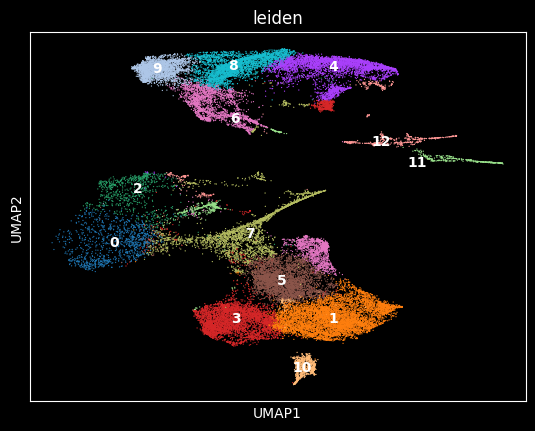

In [6]:
sc.pl.umap(alz_filter_scdata, color = 'leiden', legend_loc = 'on data')

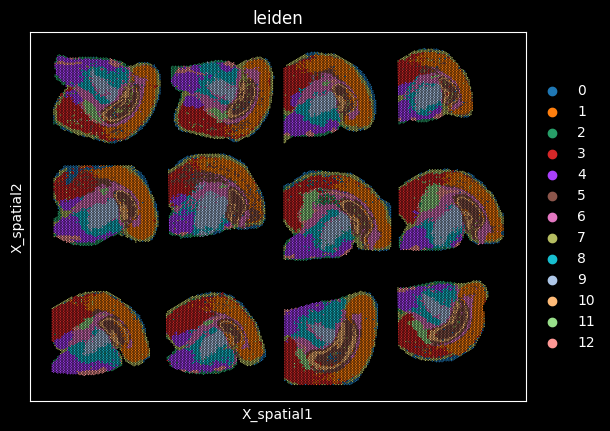

In [8]:
# we would next remove the background cells in order to plot the brain projection map
alz_filter_scdata = alz_filter_scdata[alz_filter_scdata.obs['Background'] == 1]
sc.pl.embedding(alz_filter_scdata, basis = 'X_spatial', color = 'leiden')

> To label cell types, we would like to rank genes based on expression levels for each cluster. In addition we would like to plot the brain projection map with each cluster isolated in order to know the spatial location of each cell. After we will utilize tools such as Azimuth in addition to Allen Brain Atlas in order to label the celltypes

In [9]:
leiden_list = list(alz_filter_scdata.obs['leiden'].unique())
leiden_list

['5', '3', '1', '0', '4', '8', '7', '12', '6', '9', '2', '11', '10']

In [5]:
leiden_color_palette = {
    "0": "#07ba7f",
    "1": "#00FF00",
    "2": "#0000FF",
    "3": "#7B68EE",
    "4": "#00FFFF",
    "5": "#FFFF00",
    "6": "#FF00FF",
    "7": "#FF7A00",
    "8": "#008080",
    "9": "#800000",
    "10": "#008000",
    "11": "#000080",
    "12": "#C0C0C0"
}

In [6]:
# utilizing the class we generated called Tools, we would like to create a new object called adata_alz that contains our alz_filter_scdata data
adata_alz = Tools(alz_filter_scdata, color_palette = leiden_color_palette)

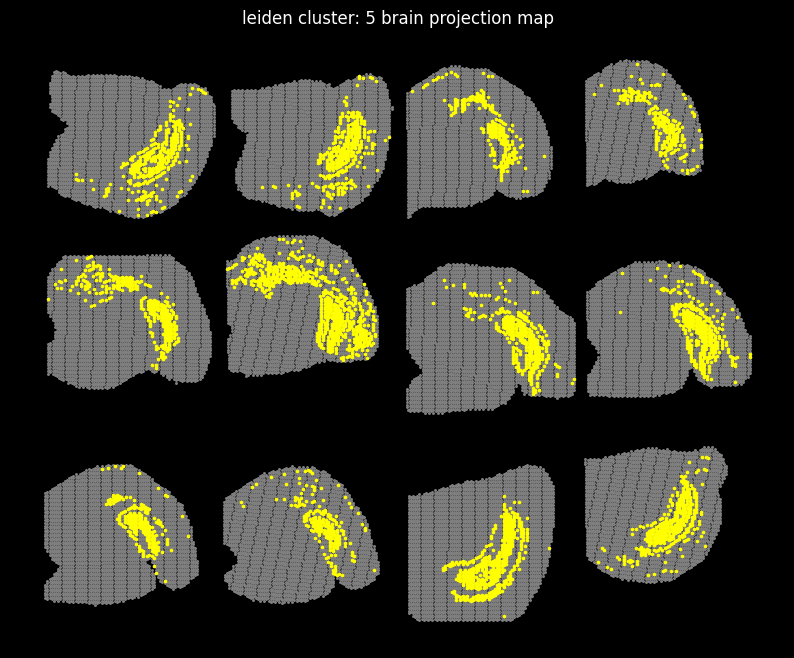

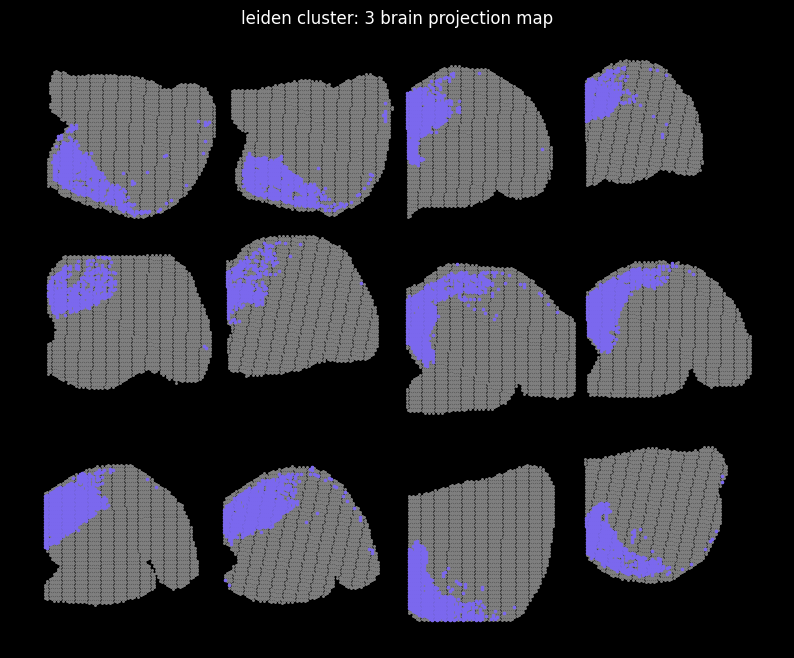

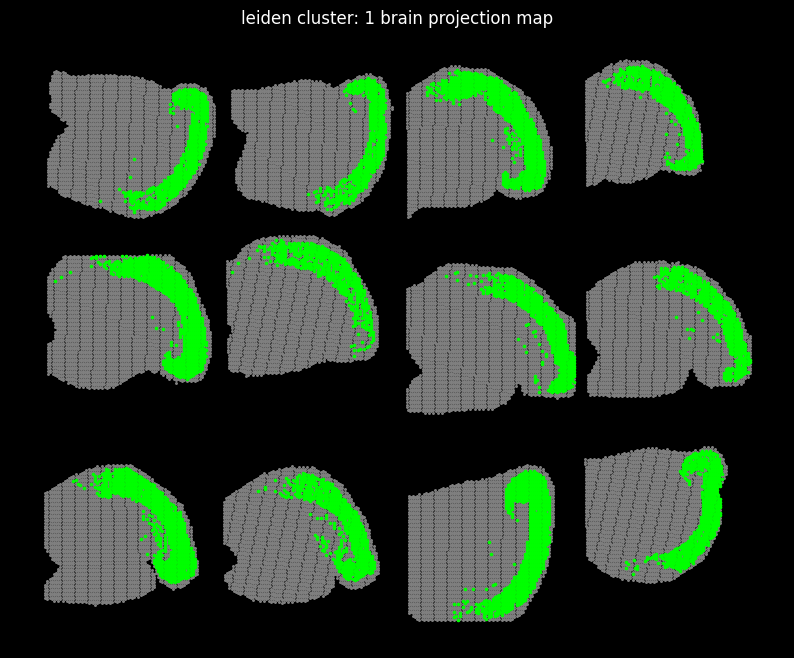

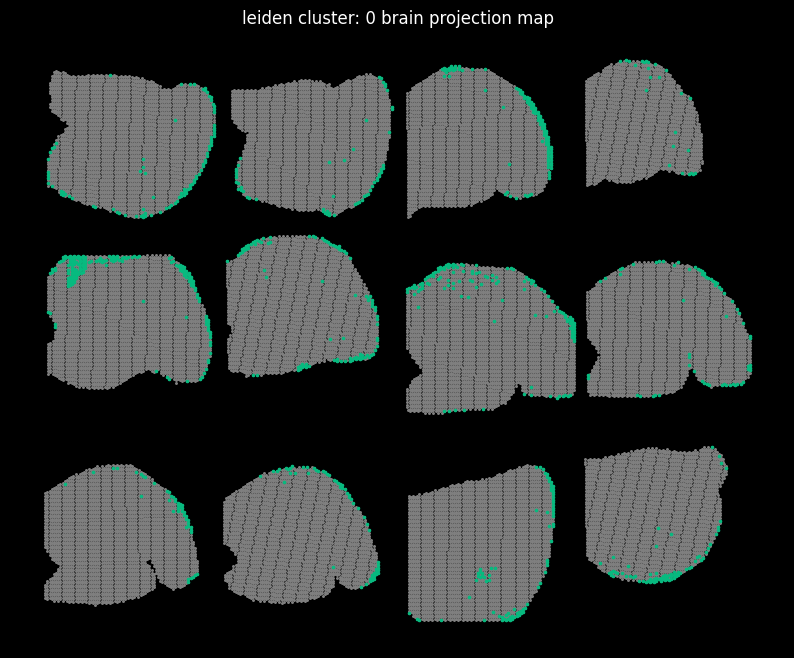

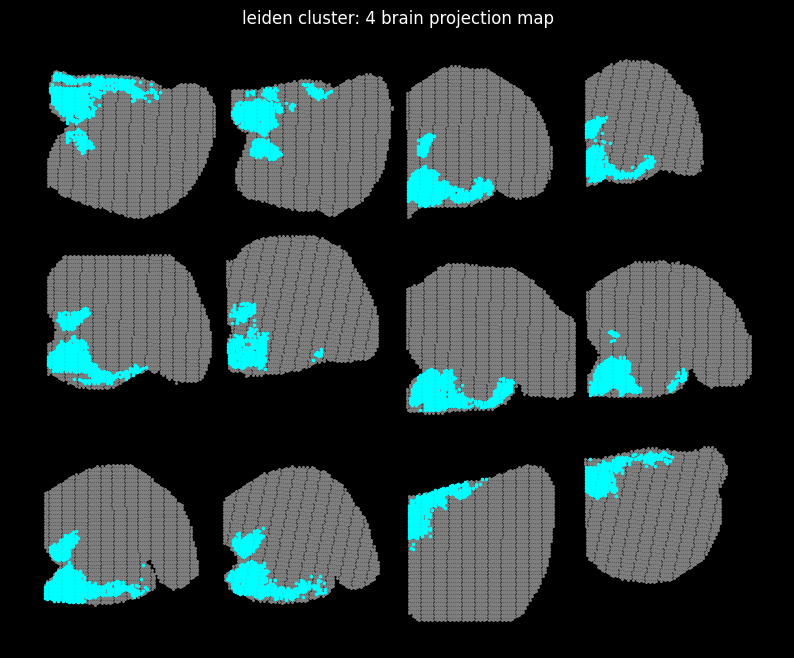

...

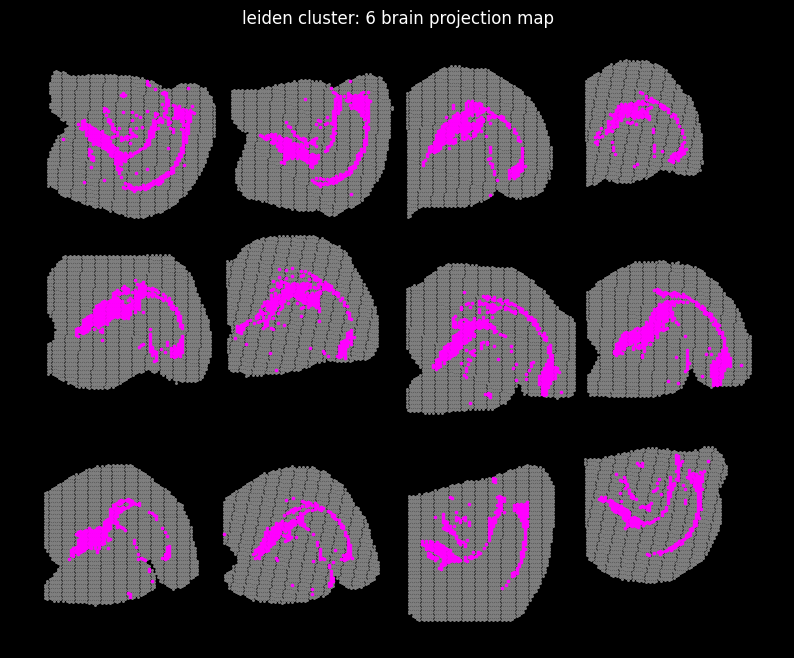

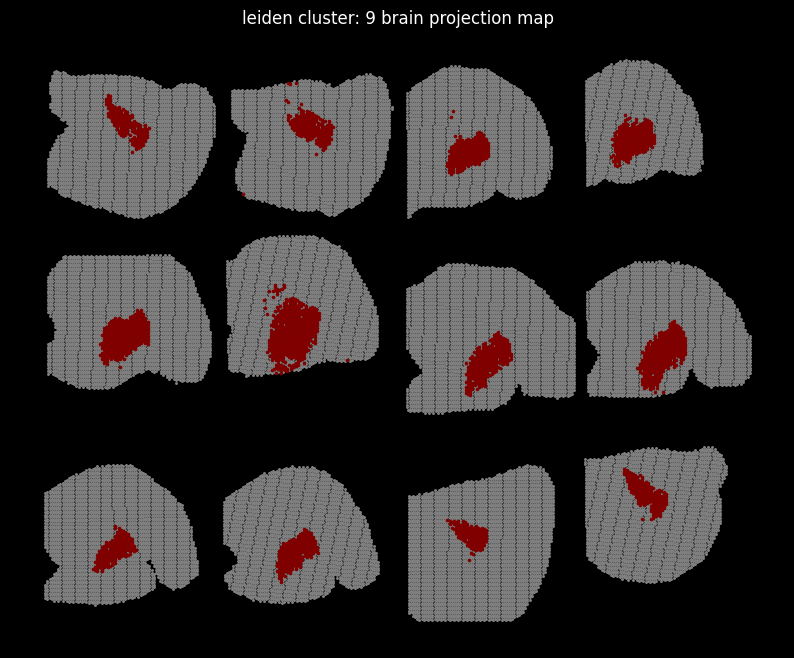

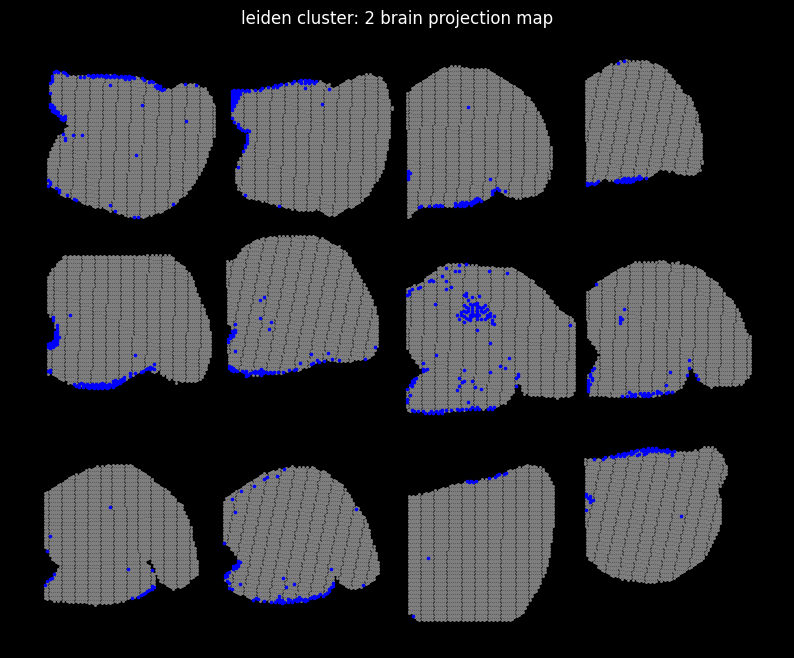

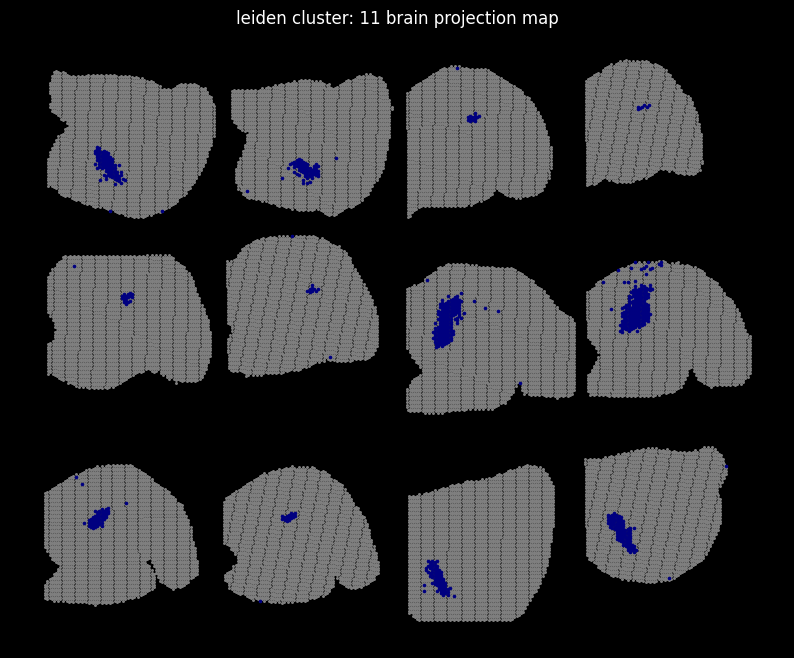

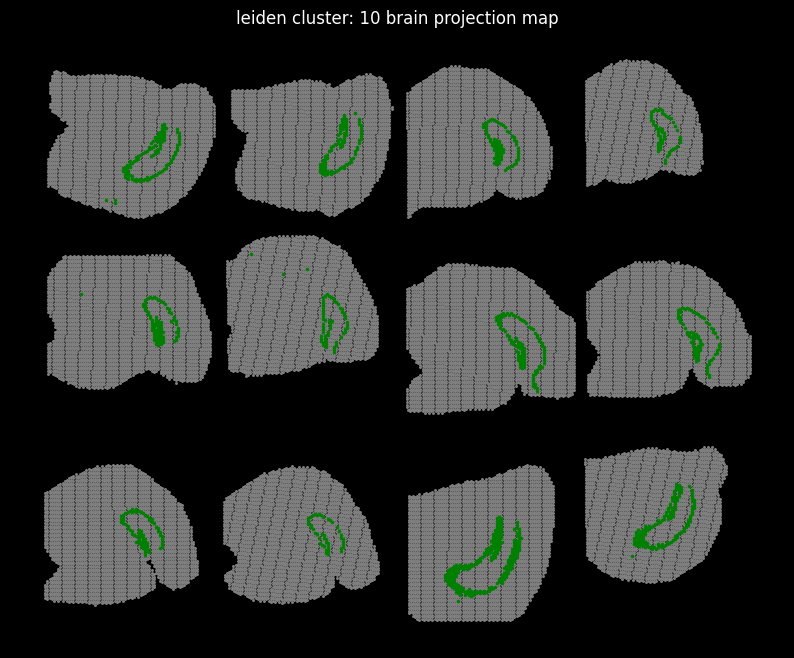

In [14]:
adata_alz.plot_brain_proj_per_cluster(color = 'leiden', s = 10)

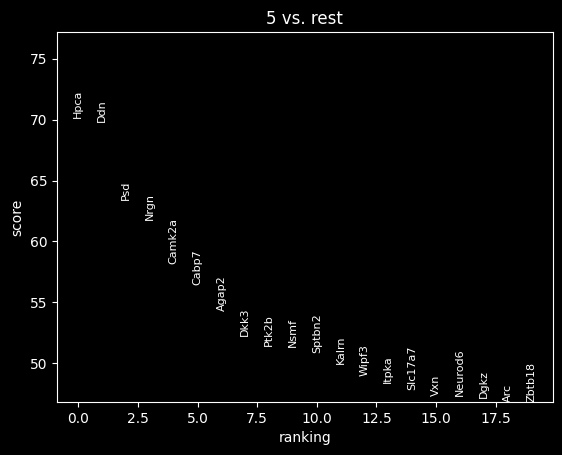

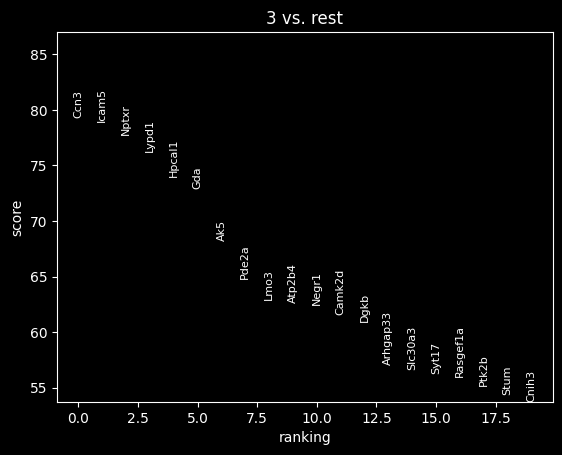

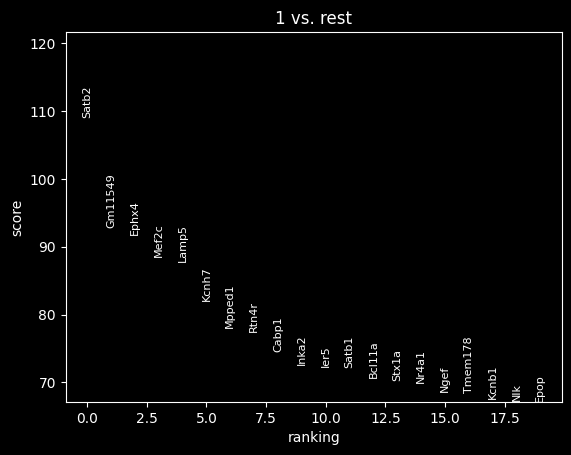

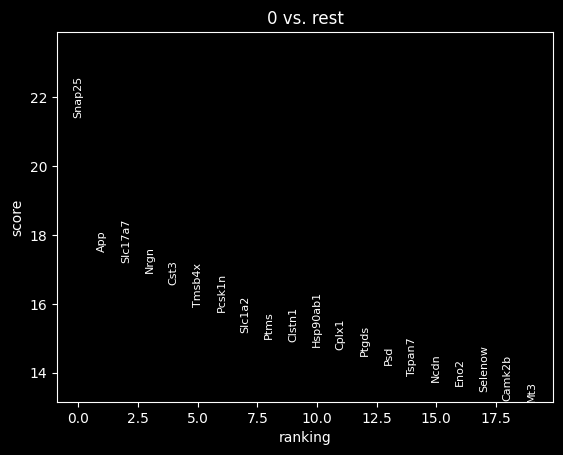

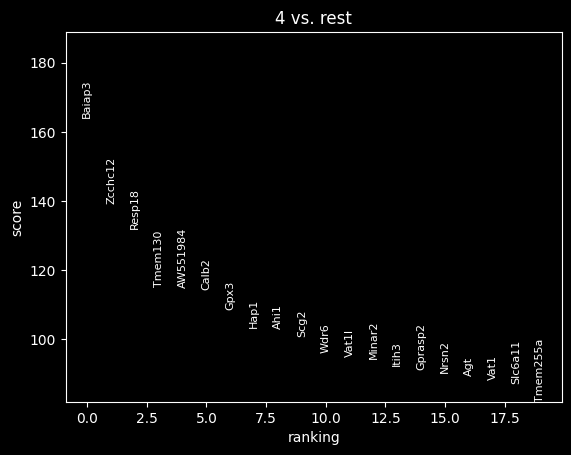

...

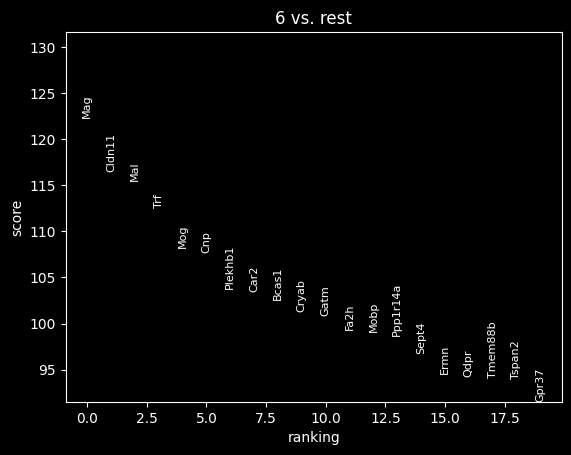

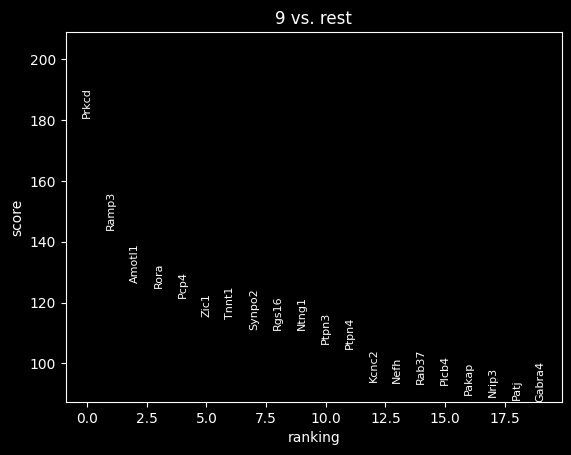

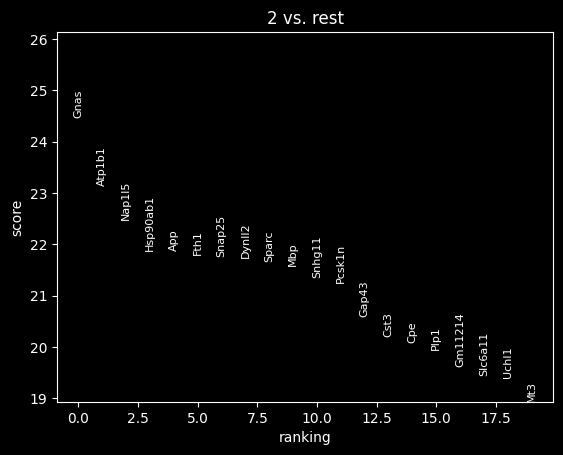

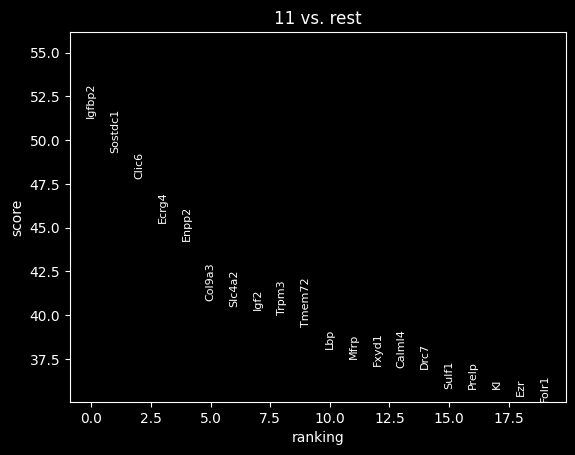

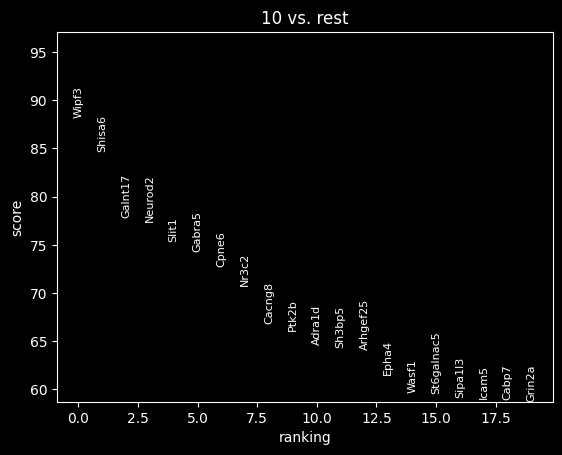

In [15]:
for i in leiden_list:
    sc.pl.rank_genes_groups(alz_filter_scdata, groups=[i])

> Utilizing the plots above in addition to tools like Azimuth which will show us the most likely cell type based on gene expression, and Allen Brain Atlas which will show us the spatial map of differnt celltypes in the Brain, we will anotate each leiden cluster with the most likely celltype. The following celltype mapping is listed below:

In [16]:
alz_celltype_mapping = {
        "0": "Cortical Neurons IV",
        "1": "Cortical Neurons III",
        "2": "Neurons",
        "3": "Cortical Neurons II",
        "4": "GABAergic Neurons",
        "5": "Cortical Neurons I",
        "6": "Oligodendrocytes",
        "7": "VLMC",
        "8": "Astrocytes I",
        "9": "Micro-PVM",
        "10": "Hippocampal Neurons",
        "11": "Striatal Neurons",
        "12": "Astrocytes II"
}

In [ ]:
# Convert category keys in the dictionary to strings
alz_celltype_mapping = {str(k): v for k, v in alz_celltype_mapping.items()}

# Map cluster IDs to cluster names using the updated dictionary
alz_filter_scdata.obs['celltype'] = alz_filter_scdata.obs['leiden'].astype(str).map(alz_celltype_mapping)

> Now we would like to generate a color dictionary for the new celltypes we generates, and regenerate the umap using celltype labeling

In [8]:
adata_alz.generate_color_dict(ref_dict=leiden_color_palette)

{"Cortical Neurons I": "#07ba7f", "Cortical Neurons II": "#00FF00", "Cortical Neurons III": "#0000FF", "Cortical Neurons IV": "#7B68EE", "GABAergic Neurons": "#00FFFF", "Astrocytes I": "#FFFF00", "VLMC": "#FF00FF", "Astrocytes II": "#FF7A00", "Oligodendrocytes": "#008080", "Micro-PVM": "#800000", "Neurons": "#008000", "Striatal Neurons": "#000080", "Hippocampal Neurons": "#C0C0C0"}


In [9]:
celltype_color_dict = {
    "Cortical Neurons I": "#07ba7f", 
    "Cortical Neurons II": "#00FF00", 
    "Cortical Neurons III": "#0000FF", 
    "Cortical Neurons IV": "#7B68EE", 
    "GABAergic Neurons": "#00FFFF", 
    "Astrocytes I": "#FFFF00", 
    "VLMC": "#FF00FF", 
    "Astrocytes II": "#FF7A00", 
    "Oligodendrocytes": "#008080", 
    "Micro-PVM": "#800000", 
    "Neurons": "#008000", 
    "Striatal Neurons": "#000080", 
    "Hippocampal Neurons": "#C0C0C0"}

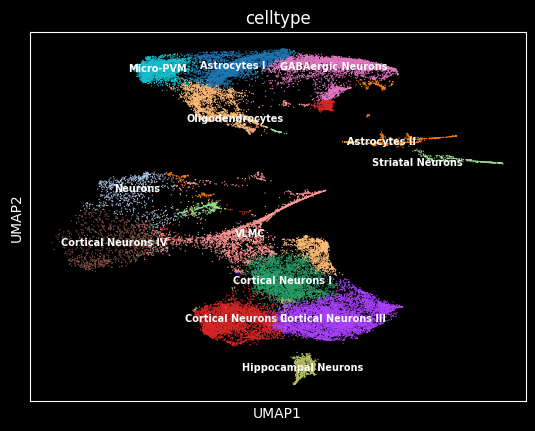

In [14]:
sc.pl.umap(alz_filter_scdata, color = 'celltype', legend_loc = 'on data', legend_fontsize=7)

# Data Analysis & Results

In our data analysis, we are interested in which celltypes of the brain are largely implicated in Alzheimer's disease. From previous studies, a series of different genes have been identified as highly expressive in Alzheimer's disease. We know that there are 2 different types of hallmark proteins associated with the disease, that being Amyloid Beta and Tau Tangles. We know that the following genes are associated with Amyloid Beta Production: ```App``` ```Psen1``` ```Psen2``` ```Bace1``` ```Sorl1```. We also know that the following genes are associated with Tau Tangle Production: ```Mapt``` ```Apoe``` ```Gsk3b``` ```Cdk5```. We will know aim to establish whether there is a particular celltype that implicated in the production of both these proteins, and aim to discover which particular region these processes occur.

First we will look at Amyloid Beta Production. For each gene we aim to find which regions in both the umap and brain projection map has a significant expression level of these genes. Looking at the gene expression level at a 99.7% level, we will discover which brain regions / celltypes have the largest expression level for each gene

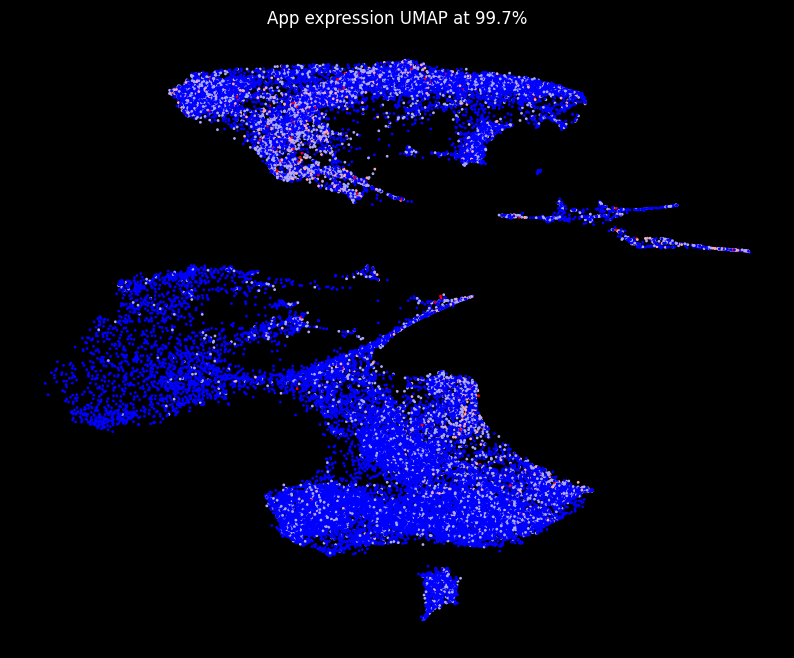

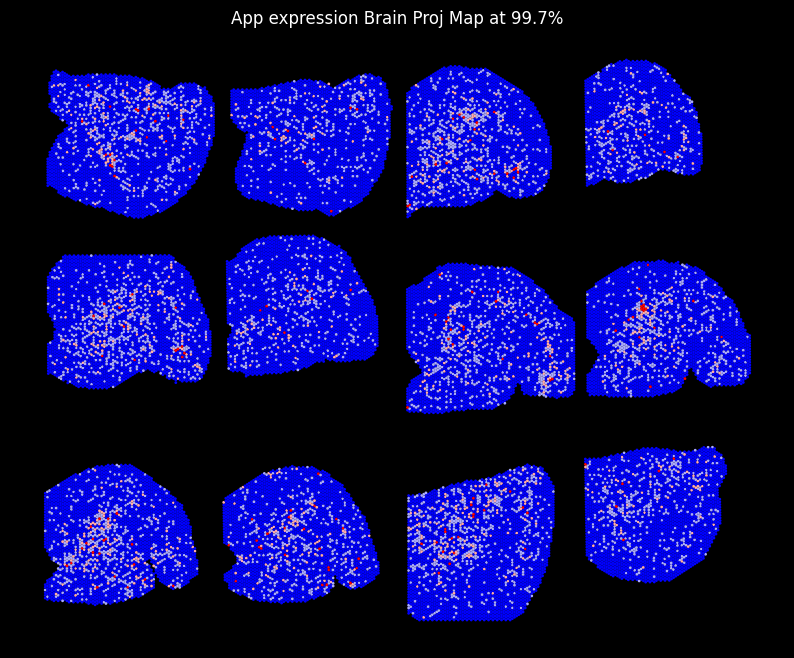

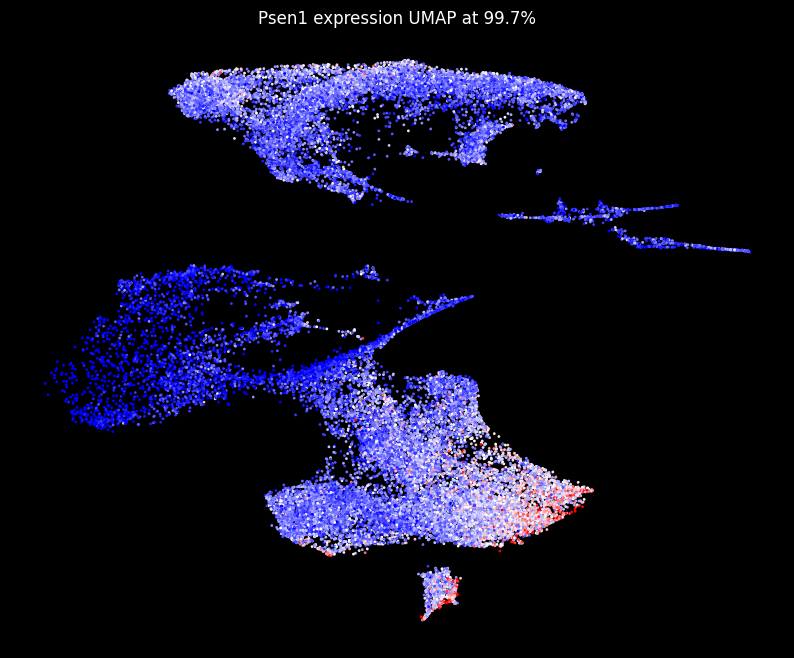

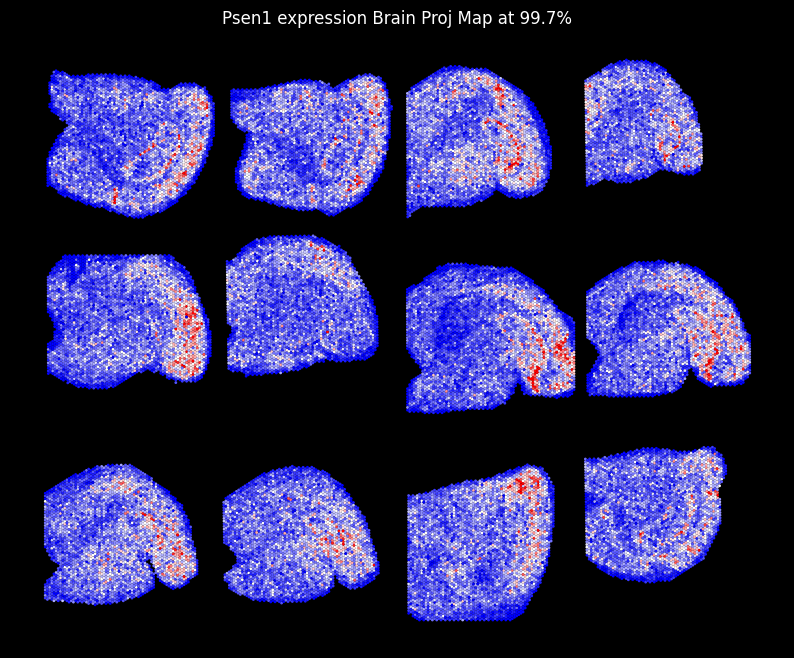

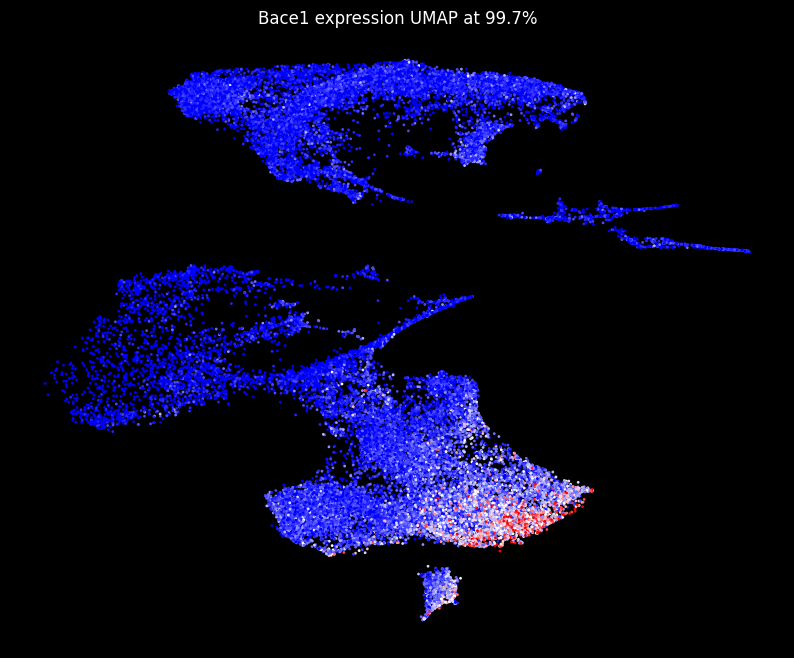

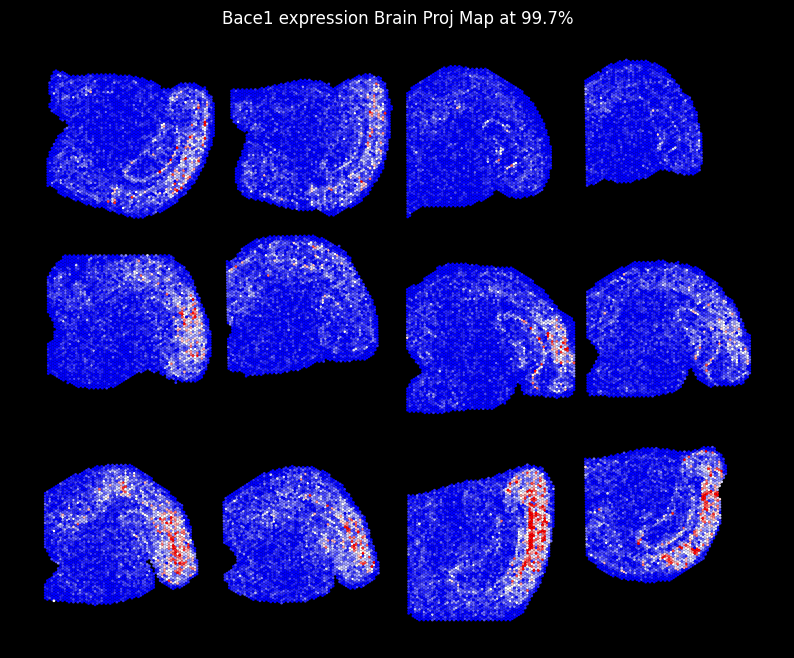

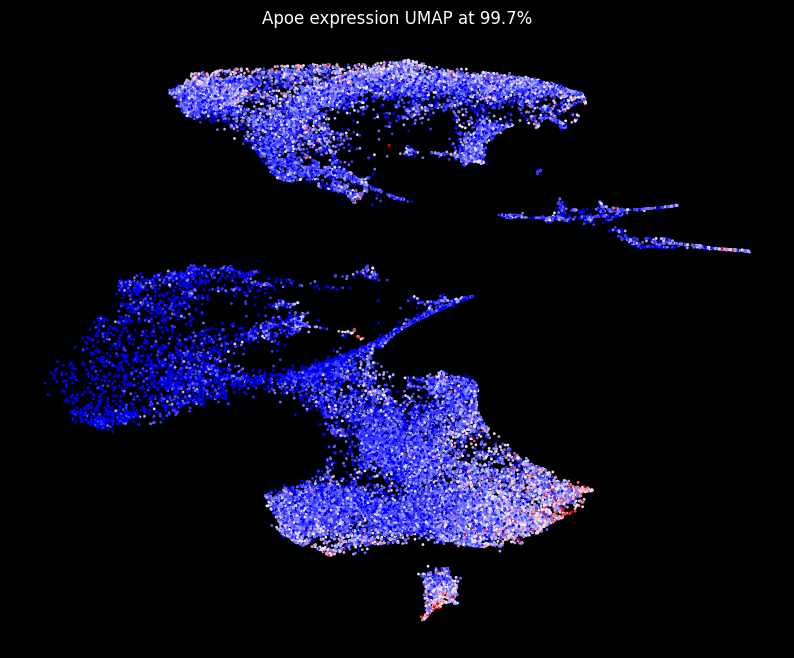

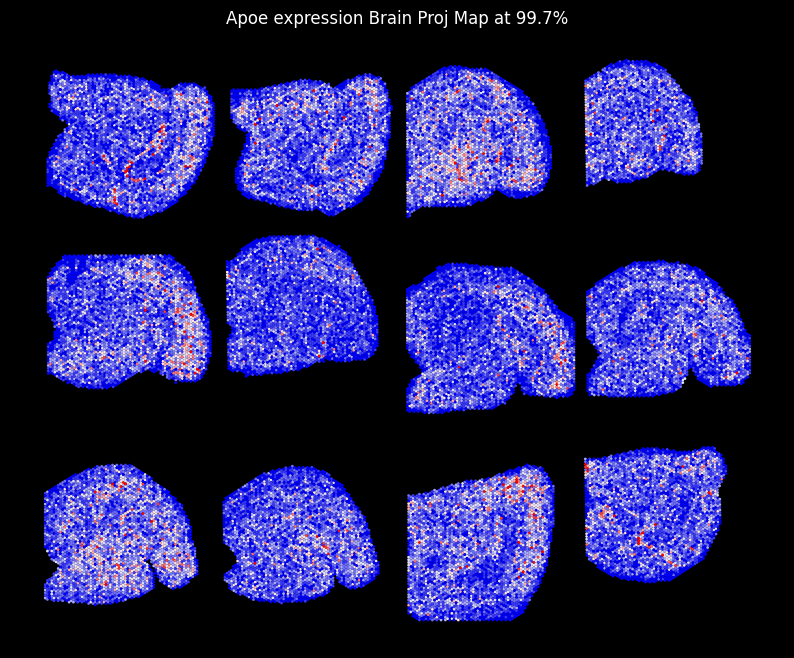

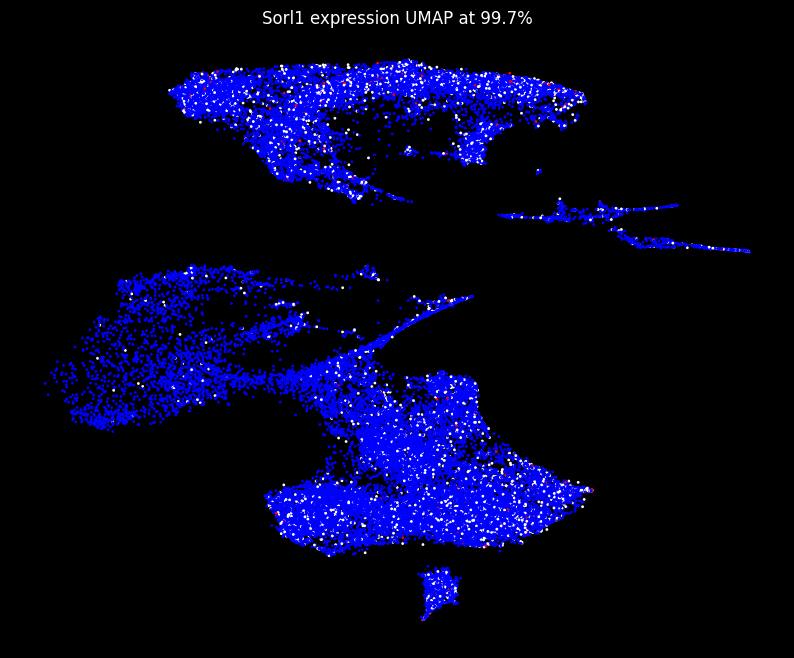

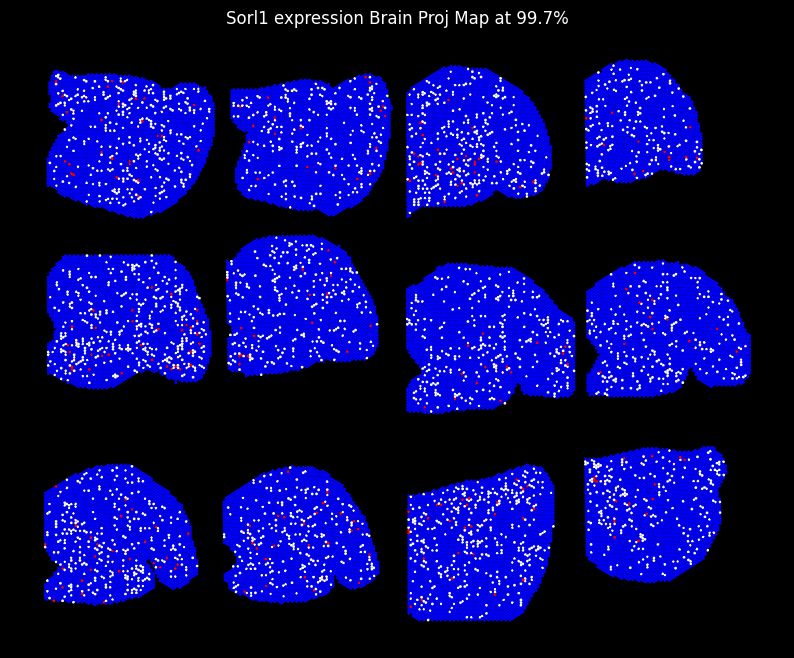

In [15]:
amyloid_beta_gene_list = ['App', 'Psen1', 'Bace1', 'Apoe', 'Sorl1']
for gene in amyloid_beta_gene_list:
    adata_alz.plot_gene_umap(gene, size = 1, percentile = 99.7)
    adata_alz.plot_gene_brain_proj(gene, size = 1, percentile = 99.7)

We will conduct the same analysis but with the genes associated with Tau Tangle Production

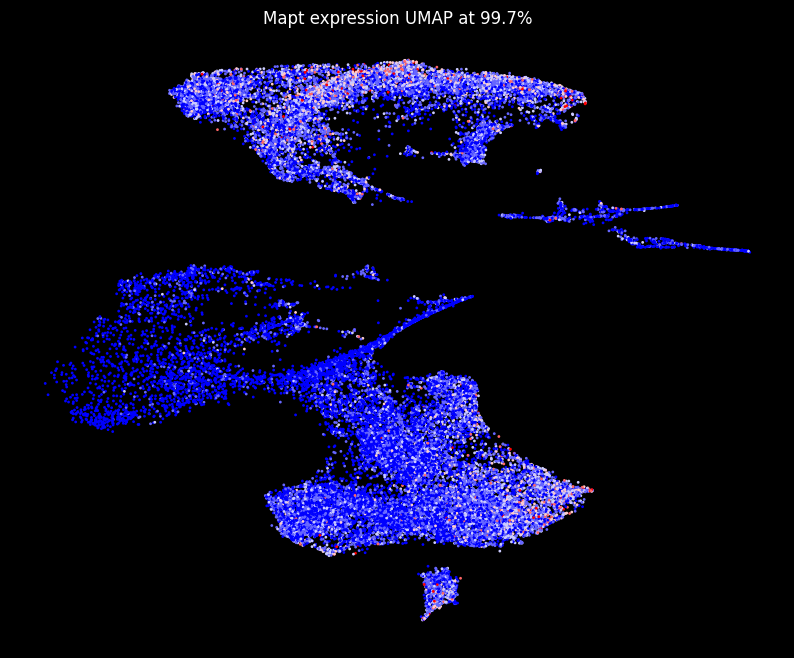

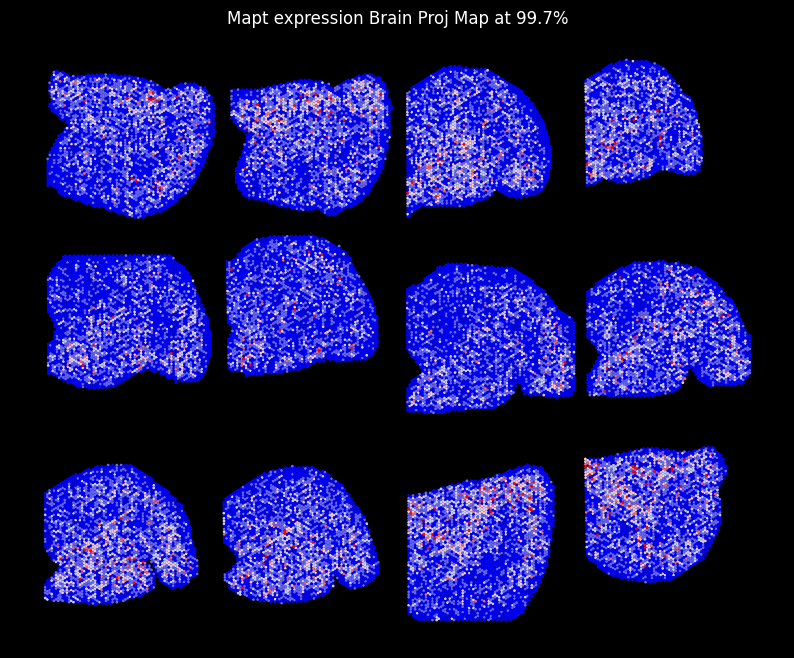

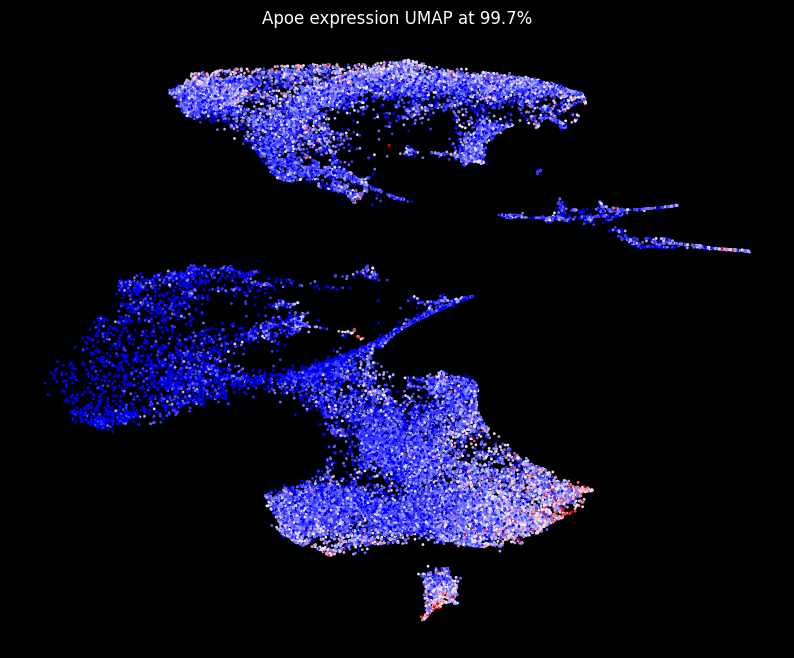

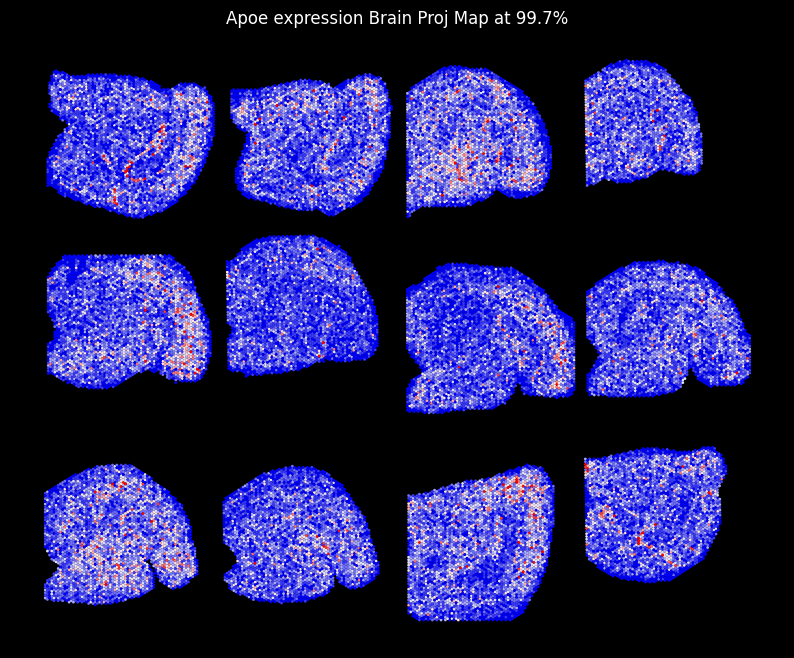

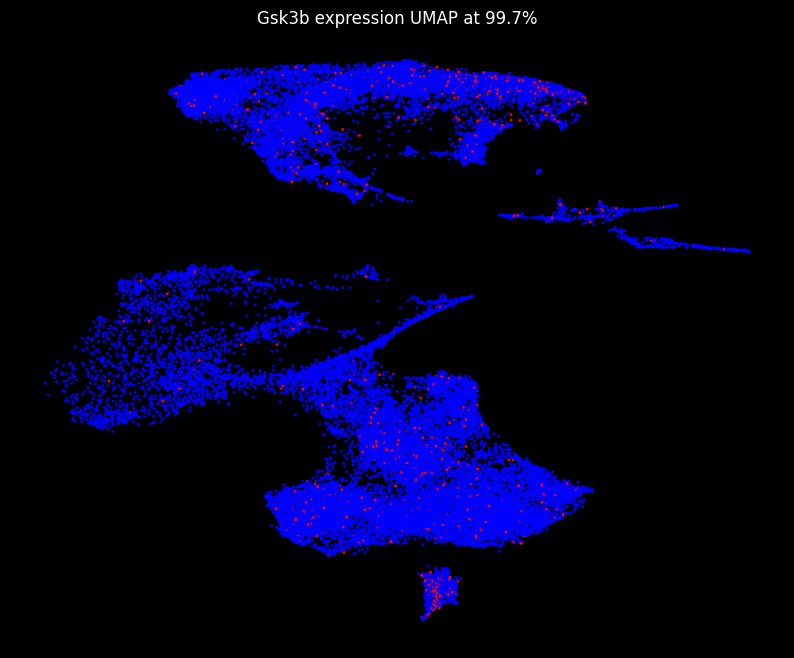

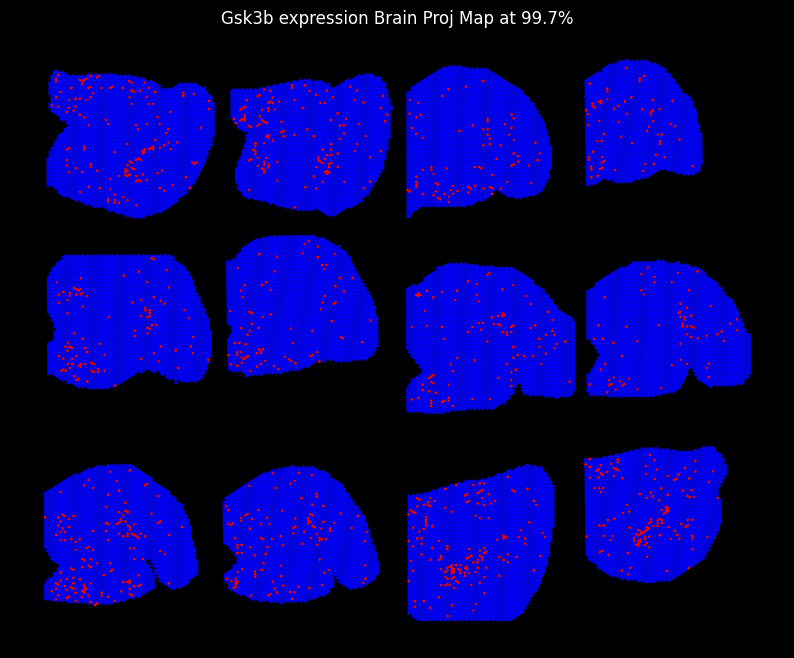

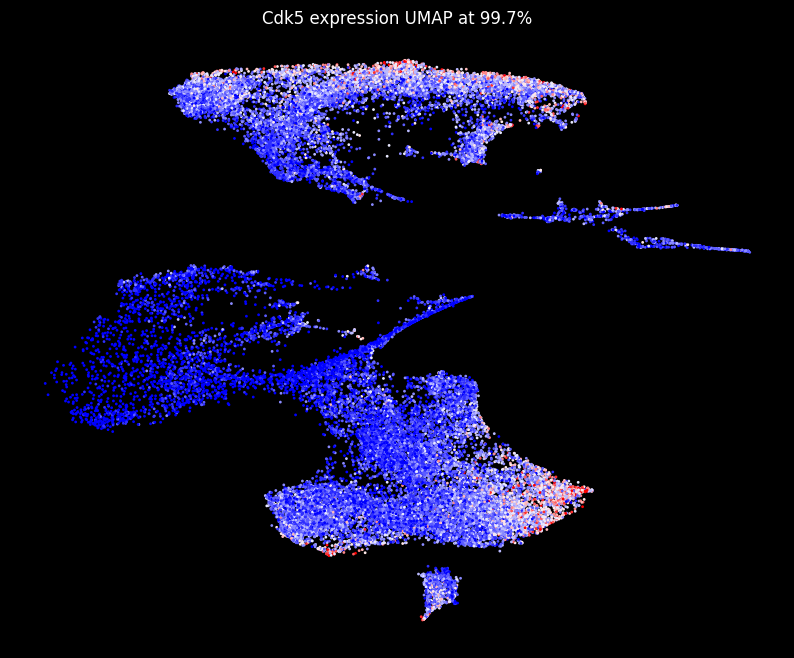

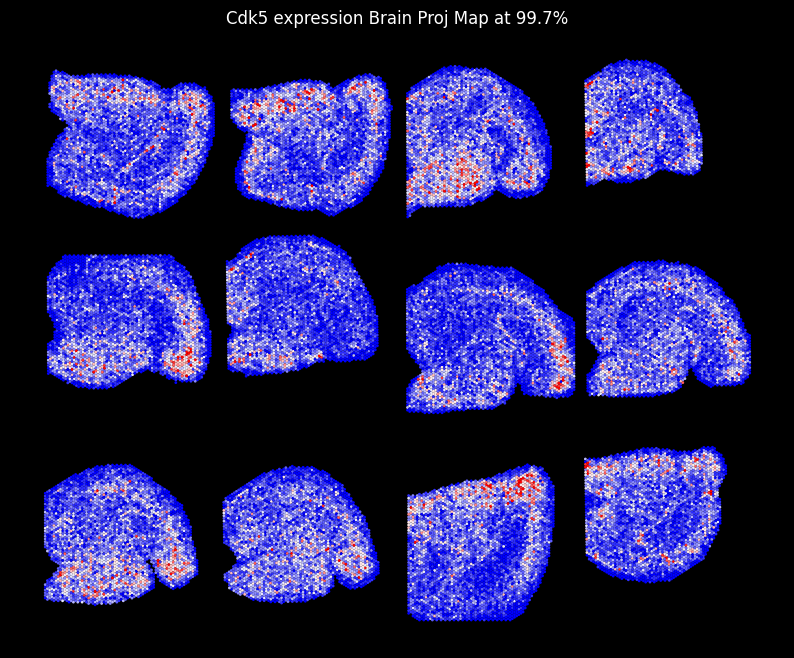

In [16]:
tau_tangles_gene_list = ["Mapt", "Apoe", "Gsk3b", "Cdk5"]
for gene in tau_tangles_gene_list:
    adata_alz.plot_gene_umap(gene, size = 1, percentile = 99.7)
    adata_alz.plot_gene_brain_proj(gene, size = 1, percentile = 99.7)

Now we will create a heatmap to summarize the expression level of each gene of interst for each celltype. Below is the heatmap summary of the gene panel associated with Amyloid Beta production

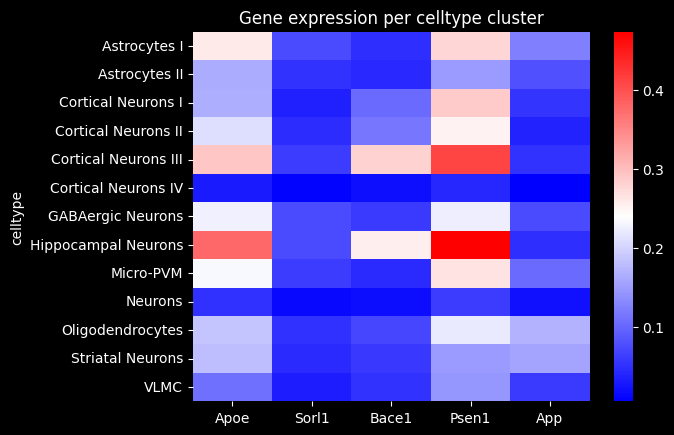

In [17]:
adata_alz.gene_expr_heatmap(amyloid_beta_gene_list, cluster = 'celltype', percentile = 99.7)

Below is the heatmap summary of the gene panel associated with Tau Tangles production

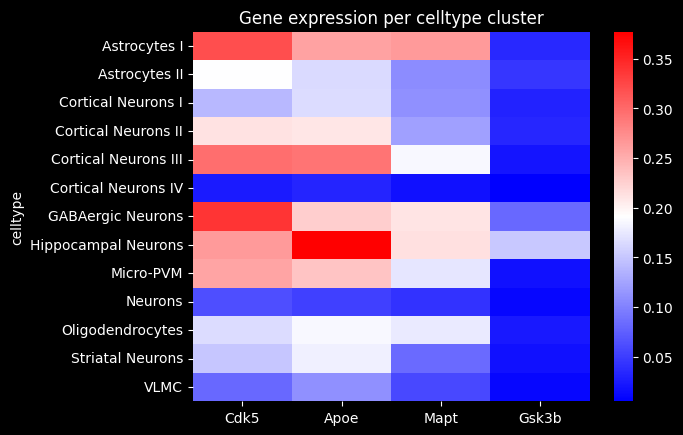

In [18]:
adata_alz.gene_expr_heatmap(tau_tangles_gene_list, cluster = 'celltype', percentile = 99.7)

To summarize the expression levels, we see that in the amyloid beta gene panel, we see that Cortical Neurons III and Hippocampal Neurons are largely implicitive in the production of amyloid beta, but mainly Hippocampal Neurons. In addition, we notice that PSEN1 appears to also be to most highly expressed gene in this particular panel. It is also worth noting that genes are mainly expressed in neuronal cells, and almost non-expressive in non neuronal cells 

Now looking at the Tau Tangle gene panel, we notice a wider distribution compared to that of teh amyloid beta gene panel. It is worth noting that expressionof Gsk3b is very little. In addition there are signficant expression of this gene panel in Astrocytes I, Cortical Neurons III, GABAergicn Neurons, and Hippocampal Neurons. It is also worth noting that the expression of this gene panel is not exclusive to only neuronal cells as Astrocyes I and Micro-PVM appear to have fair expression levels of this panel, unlike that of the amyloid beta panel. In addition we see overlap with Hippocampal Neurons and Cortical Neurons III having high expression levels across both gene panels

# Conclusion & Discussion

Our study explored the varied expression levels of genes linked to amyloid beta and tau tangles across different brain cell types. By doing so, we confirmed our initial hypothesis, identifying key cell types critically involved in the synthesis of these proteins and disproportionately impacted by Alzheimer’s disease. These cell-specific expression patterns not only validate our understanding of Alzheimer's at the cellular level but also highlight potential targets for more focused therapeutic interventions. More specifically, we validate how Amyloid Beta proteins is largely assoicated with neuronal cells more specifically hippocampal neurons. In addition we see how Tau Tangle proteins are more distributed compared to amyloid beta, and are present in the hippocampal and cortical regions of the brain as well as in neuronal and non-neuronal cells (e.g. Astrocytes, Micro-PVM)

To dive deeper into what our findings suggest, it evaluated certain cell typewhether they be neuronal or non-neuronal cellsay play critical roles in the pathogenesis of Alzheimer's disease through their distinct gene expression profiles. This underscores the importance of targeting these specific cells in future therapeutic strategies. Furthermore, the use of spatial transcriptomics in our study provided a high-resolution map of gene expression, which has been instrumental in pinpointing the cellular locales of disease progression. Moreover, our research raises important questions about the potential for reversing or mitigating the effects of Alzheimer's by manipulating gene expression in these key cell types. Could targeted therapies that adjust gene expression in these cells slow or alter the disease's trajectory? Additionally, our findings could inform the development of diagnostic tools that detect Alzheimer's based on the expression patterns of these critical genes early in the disease process.

In conclusion, while our study advances the understanding of Alzheimer’s pathology, it also opens the door to new research paths that could lead to breakthroughs in how we diagnose, monitor, and treat this debilitating disease. The cellular and molecular insights gained here are crucial stepping stones towards more effective and personalized medicine for Alzheimer's patients.



# Acknowledgements

The dataset 